![]("/content/download.jpeg")

## Introduction:

Welcome to our collaborative notebook on image captioning, where we delve into three fundamental tasks shaping the landscape of computer vision and natural language processing. In this project, we aim to rigorously investigate caption generation, image-text retrieval, and multimodal fusion, each playing a crucial role in advancing our understanding of how machines perceive and describe visual content.

Within the realm of image captioning, our focus on these tasks stems from their significance in addressing real-world challenges and pushing the boundaries of current methodologies. By meticulously documenting our methodologies, experiments, and analyses, this notebook serves as a comprehensive resource for our collective efforts in unraveling the complexities of image captioning.

Our approach is grounded in collaboration, drawing upon diverse perspectives and expertise to navigate the intricacies of image understanding and language processing. Through our exploration, we aspire to contribute valuable insights and drive innovation in the field, ultimately paving the way for enhanced machine comprehension and communication.

## Implementation 1: Using CNN and LSTM based approach

#### Mounting Google Drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


#### Unzipping Flickr 8k dataset

In [ ]:
# !unzip -o '/content/drive/MyDrive/Deep learning project/8k_images/archive.zip' -d '/content/drive/MyDrive/Deep learning project/8k_images'

#### Install necessary packages

In [ ]:
import tensorflow as tf
physical_devices = tf.config.list_physical_devices('GPU')

print("GPU:", tf.config.list_physical_devices('GPU'))
print("Num GPUs:", len(physical_devices))

GPU: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
Num GPUs: 1


#### import all the necessary packages

In [ ]:
import string
import numpy as np
from PIL import Image
import os
from pickle import dump, load
import numpy as np
import pandas as pd
import os
from tqdm import tqdm  # Using tqdm from its original package
import tensorflow as tf
from tensorflow.keras.applications import Xception
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.xception import preprocess_input
from pickle import dump

from keras.applications.xception import Xception, preprocess_input
from keras.preprocessing.image import load_img, img_to_array
from keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.utils import to_categorical
# from keras.utils import to_categorical
from keras.layers import Concatenate
from keras.models import Model, load_model
from keras.layers import Input, Dense, LSTM, Embedding, Dropout

# small library for seeing the progress of loops.
from tqdm.notebook import tqdm


#### Getting and performing data cleaning

In [ ]:
# loading data in memory
def load_doc(filename):
    data = pd.read_csv(filename, delimiter=',')
    return data

# get all imgs with their captions
def all_img_captions(filename):
    dataframe = load_doc(filename)
    descriptions = {}
    for i, row in dataframe.iterrows():
        image_name = row['image']
        if image_name not in descriptions:
            descriptions[image_name] = []
        descriptions[image_name].append(row['caption'])
    return descriptions

#Data cleaning- lower casing, removing puntuations and words containing numbers
def cleaning_text(captions):
    table = str.maketrans('','',string.punctuation)
    for img,caps in captions.items():
        for i,img_caption in enumerate(caps):
            #tokenize each word in the caption
            img_caption.replace("-"," ")
            desc = img_caption.split()

            #converts to lowercase
            desc = [word.lower() for word in desc]
            #remove punctuation from each token
            desc = [word.translate(table) for word in desc]
            #remove hanging 's and a
            desc = [word for word in desc if(len(word)>1)]
            #remove tokens with numbers in them
            desc = [word for word in desc if(word.isalpha())]
            #convert back to string

            img_caption = ' '.join(desc)
            captions[img][i]= img_caption
    return captions

def text_vocabulary(descriptions):
    # build vocabulary of all unique words
    vocab = set()

    for key in descriptions.keys():
        [vocab.update(d.split()) for d in descriptions[key]]

    return vocab

#All descriptions in one file
def save_descriptions(descriptions, filename):
    lines = list()
    for key, desc_list in descriptions.items():
        for desc in desc_list:
            lines.append(key + '\t' + desc )
    data = "\n".join(lines)
    file = open(filename,"w")
    file.write(data)
    file.close()

In [ ]:

base_dir = "drive/MyDrive/Deep learning project/base_data"

In [ ]:
# Set these path according to project folder in you system
dataset_text = "drive/MyDrive/Deep learning project/8k_images/captions.txt"
dataset_images = "drive/MyDrive/Deep learning project/8k_images/Images"

#loading the file that contains all data
#mapping them into descriptions dictionary img to 5 captions
descriptions = all_img_captions(dataset_text)
print("Length of descriptions =" , len(descriptions))

#cleaning the descriptions
clean_descriptions = cleaning_text(descriptions)

#building vocabulary
vocabulary = text_vocabulary(clean_descriptions)
print("Length of vocabulary = ", len(vocabulary))

#saving each description to file
save_descriptions(clean_descriptions, f"{base_dir}/descriptions.txt")

Length of descriptions = 8091
Length of vocabulary =  8763


#### Extracting the feature vector from all images (TAKES TIME)

In [ ]:
def extract_features(directory):
    # Configure TensorFlow to use the GPU
    physical_devices = tf.config.list_physical_devices('GPU')
    if len(physical_devices) == 0:
        print("No GPU devices available. Using CPU.")
    else:
        tf.config.experimental.set_memory_growth(physical_devices[0], True)

    # Load the Xception model
    model = Xception(include_top=False, pooling='avg')

    features = {}
    for img_name in tqdm(os.listdir(directory), desc="Extracting Features"):
        img_path = os.path.join(directory, img_name)
        img = image.load_img(img_path, target_size=(299, 299))
        img_array = image.img_to_array(img)
        img_array = np.expand_dims(img_array, axis=0)
        img_array = preprocess_input(img_array)

        # Extract features
        feature = model.predict(img_array)
        features[img_name] = feature

    return features

# feature vector
features = extract_features(dataset_images)
dump(features, open(f"{base_dir}/features.p", "wb"))


In [ ]:
features = load(open(f"{base_dir}/features.p","rb"))

#### Loading dataset for Training the model

In [ ]:
# Load the data
def load_photos(directory, train_list):
    photos = os.listdir(directory)
    train_images = []
    for i in photos:
      if i in train_list:
        train_images.append(i)
    return train_images

def load_clean_descriptions(filename, photos):
    # Loading clean descriptions
    descriptions = {}
    with open(filename, 'r') as file:
        for line in tqdm(file, desc="Loading Descriptions", total=len(photos)):
            words = line.split()
            if len(words) < 1:
                continue
            image, image_caption = words[0], words[1:]
            if image in photos:
                if image not in descriptions:
                    descriptions[image] = []
                desc = '<start> ' + " ".join(image_caption) + ' <end>'
                descriptions[image].append(desc)
    return descriptions

def load_features(photos):
    # Loading all features
    all_features = load(open(f"{base_dir}/features.p", "rb"))
    # Selecting only needed features
    features = {k: all_features[k] for k in photos if "jpg" in k}
    return features

# Define the directory containing the images
image_directory = dataset_images

In [ ]:
image_ids = list(features.keys())
split = int(len(image_ids) * 0.90)
train = image_ids[:split]
test_images = image_ids[split:]

In [ ]:
len(train
    )

7281

In [ ]:
# Load the list of image filenames
print("Loading Image Filenames...")
train_imgs = load_photos("/content/drive/MyDrive/Deep learning project/8k_images/Images", train)

Loading Image Filenames...


In [ ]:
# Load the clean descriptions for the images
train_descriptions = load_clean_descriptions(f"{base_dir}/descriptions.txt", train_imgs)


Loading Descriptions:   0%|          | 0/7281 [00:00<?, ?it/s]

In [ ]:
# Load the features for the images
print("Loading Features...")
train_features = load_features(train_imgs)

Loading Features...


#### Tokenizing the vocabulary

In [ ]:
#converting dictionary to clean list of descriptions
def dict_to_list(descriptions):
    all_desc = []
    for key in descriptions.keys():
        [all_desc.append(d) for d in descriptions[key]]
    return all_desc

#creating tokenizer class
#this will vectorise text corpus
#each integer will represent token in dictionary

from keras.preprocessing.text import Tokenizer

def create_tokenizer(descriptions):
    desc_list = dict_to_list(descriptions)
    tokenizer = Tokenizer()
    tokenizer.fit_on_texts(desc_list)
    return tokenizer

# give each word an index, and store that into tokenizer.p pickle file
tokenizer = create_tokenizer(train_descriptions)
dump(tokenizer, open(f'{base_dir}/tokenizer.p', 'wb'))
vocab_size = len(tokenizer.word_index) + 1
vocab_size

8386

In [ ]:
#calculate maximum length of descriptions
def max_length(descriptions):
    desc_list = dict_to_list(descriptions)
    return max(len(d.split()) for d in desc_list)

max_length = max_length(descriptions)
max_length

32

####  Create Data generator

In [ ]:
#create input-output sequence pairs from the image description.

#data generator, used by model.fit_generator()
def data_generator(descriptions, features, tokenizer, max_length):
    while 1:
        for key, description_list in descriptions.items():
            #retrieve photo features
            feature = features[key][0]
            input_image, input_sequence, output_word = create_sequences(tokenizer, max_length, description_list, feature)
            yield ([input_image, input_sequence], output_word)

def create_sequences(tokenizer, max_length, desc_list, feature):
    X1, X2, y = list(), list(), list()
    # walk through each description for the image
    for desc in desc_list:
        # encode the sequence
        seq = tokenizer.texts_to_sequences([desc])[0]
        # split one sequence into multiple X,y pairs
        for i in range(1, len(seq)):
            # split into input and output pair
            in_seq, out_seq = seq[:i], seq[i]
            # pad input sequence
            in_seq = pad_sequences([in_seq], maxlen=max_length)[0]
            # encode output sequence
            out_seq = to_categorical([out_seq], num_classes=vocab_size)[0]
            # store
            X1.append(feature)
            X2.append(in_seq)
            y.append(out_seq)
    return np.array(X1), np.array(X2), np.array(y)

#You can check the shape of the input and output for your model
[a,b],c = next(data_generator(train_descriptions, features, tokenizer, max_length))
a.shape, b.shape, c.shape
#((47, 2048), (47, 32), (47, 7577))

((47, 2048), (47, 32), (47, 8386))

#### Defining the CNN-RNN model

In [ ]:
from tensorflow.keras.utils import plot_model
from keras.layers import add

# define the captioning model
def define_model(vocab_size, max_length):

    # features from the CNN model squeezed from 2048 to 256 nodes
    inputs1 = Input(shape=(2048,))
    fe1 = Dropout(0.5)(inputs1)
    fe2 = Dense(256, activation='relu')(fe1)

    # LSTM sequence model
    inputs2 = Input(shape=(max_length,))
    se1 = Embedding(vocab_size, 256, mask_zero=True)(inputs2)
    se2 = Dropout(0.5)(se1)
    se3 = LSTM(256)(se2)

    # Merging both models
    decoder1 = add([fe2, se3])
    decoder2 = Dense(256, activation='relu')(decoder1)
    outputs = Dense(vocab_size, activation='softmax')(decoder2)

    # tie it together [image, seq] [word]
    model = Model(inputs=[inputs1, inputs2], outputs=outputs)
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

    # summarize model
    print(model.summary())
    plot_model(model, to_file=f'{base_dir}/model.png', show_shapes=True)

    return model

#### TRAINING SECTION

In [ ]:
import matplotlib.pyplot as plt

# Lists to store training accuracy and loss
train_accuracies = []
train_losses = []

Dataset:  7281
Descriptions: train= 7281
Photos: train= 7281
Vocabulary Size: 8386
Description Length:  32
Model: "model_4"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_10 (InputLayer)       [(None, 32)]                 0         []                            
                                                                                                  
 input_9 (InputLayer)        [(None, 2048)]               0         []                            
                                                                                                  
 embedding_4 (Embedding)     (None, 32, 256)              2146816   ['input_10[0][0]']            
                                                                                                  
 dropout_8 (Dropout)         (None, 2048)                 0         ['input_9[0][0]'

<ipython-input-28-c88b5af2efbd>:32: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model.fit_generator(generator, epochs=1, steps_per_epoch=steps, verbose=1)


227/227 [==============================] - 31s 103ms/step - loss: 6.6330 - accuracy: 0.0487


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


227/227 [==============================] - 19s 85ms/step - loss: 1.5076 - accuracy: 0.5571


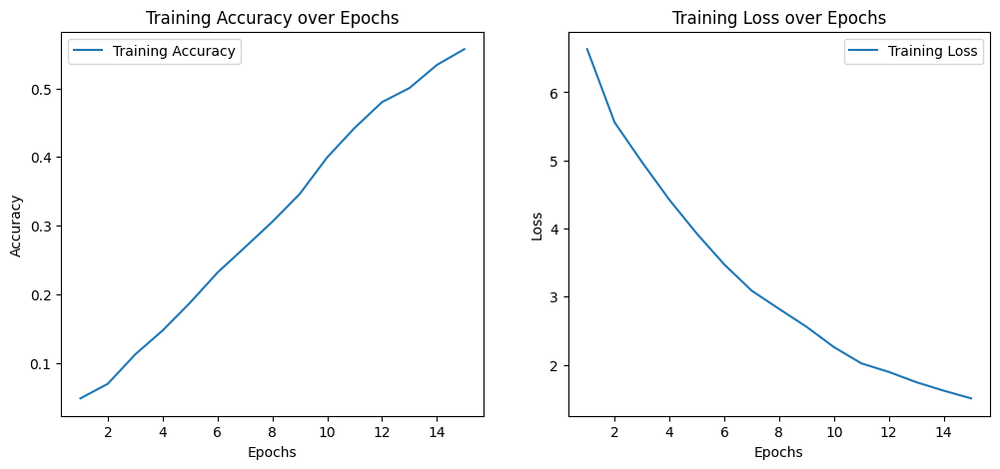

In [ ]:
import os
import matplotlib.pyplot as plt

# Initialize lists to store training accuracy and loss
train_accuracies = []
train_losses = []

# Define constants
epochs = 15
batch_size = 32  # Define your batch size here
steps = len(train_descriptions) // batch_size

# Print dataset information
print('Dataset: ', len(train_imgs))
print('Descriptions: train=', len(train_descriptions))
print('Photos: train=', len(train_features))
print('Vocabulary Size:', vocab_size)
print('Description Length: ', max_length)

# Define and compile your model
model = define_model(vocab_size, max_length)
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
print(model.summary())

# Create directory to save models if it doesn't exist
if not os.path.exists(f"{base_dir}/models"):
    os.mkdir(f"{base_dir}/models")

# Training loop
for i in range(epochs):
    generator = data_generator(descriptions, features, tokenizer, max_length
                               )
    history = model.fit_generator(generator, epochs=1, steps_per_epoch=steps, verbose=1)

    # Store accuracy and loss
    if 'accuracy' in history.history:
        train_accuracies.append(history.history['accuracy'][0])
    elif 'acc' in history.history:
        train_accuracies.append(history.history['acc'][0])  # For older TensorFlow versions
    else:
        train_accuracies.append(None)  # Handle case where accuracy is not available
    train_losses.append(history.history['loss'][0])

    # Save the model after each epoch
    model.save(f"{base_dir}/models/model_" + str(i) + ".h5")

# Plot training accuracy and loss
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(range(1, epochs + 1), train_accuracies, label='Training Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Training Accuracy over Epochs')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(range(1, epochs + 1), train_losses, label='Training Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training Loss over Epochs')
plt.legend()

plt.show()


#### TESTING THE MODEL USING DUMY FOLLOWING IMAGE AND CODE

In [ ]:
images = "drive/MyDrive/Deep learning project/8k_images/Images"
import random
test = random.choice(os.listdir(images))

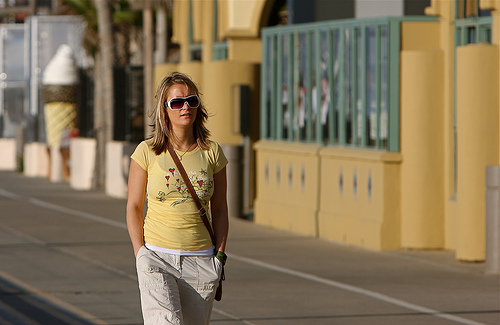

In [ ]:
from PIL import Image
# temp = "drive/MyDrive/Deep learning project/test images/Screenshot 2024-04-22 161846.png"
img = Image.open(f"{images}/{test}")
# img = Image.open(img)

img

In [ ]:
from keras.preprocessing.sequence import pad_sequences
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt

# Load the trained model
model = load_model('drive/MyDrive/Deep learning project/base_data/models/model_9.h5')

def extract_features_from_image(img_path):
    # Load the Xception model
    model_xception = Xception(include_top=False, pooling='avg')

    img = Image.open(img_path)
    img = img.resize((299, 299))
    img_array = np.expand_dims(np.array(img), axis=0)
    img_array = preprocess_input(img_array)

    # Extract features
    feature = model_xception.predict(img_array)

    return feature

# Function to map word index to word
def word_for_id(integer, tokenizer):
    for word, index in tokenizer.word_index.items():
        if index == integer:
            return word
    return None

def generate_caption(image_array):
    # Preprocess the image
    # image_array = preprocess_image(image_array)

    # Extract features using the pre-trained CNN model
    image_feature = extract_features_from_image(image_array)

    # Initialize an empty caption list
    caption = []

    # Define the maximum length of the caption
    max_caption_length = 20

    # Initialize the input sequence with start token
    input_sequence = tokenizer.texts_to_sequences(['<start>'])[0]

    # Loop until maximum caption length is reached
    for i in range(max_caption_length):
        # Pad the input sequence
        input_sequence = pad_sequences([input_sequence], maxlen=max_length, padding='post')

        # Predict the next word probability using the model
        yhat = model.predict([image_feature, input_sequence], verbose=0)

        # Get the index of the word with the highest probability
        yhat_index = np.argmax(yhat)

        # Map the index to the word
        word = word_for_id(yhat_index, tokenizer)

        # If the word is not found, break the loop
        if word is None:
            break

        # Append the word to the caption
        caption.append(word)

        # Break the loop if the end token is encountered
        if word == '<end>':
            break

        # Update the input sequence for the next iteration
        input_sequence = np.append(input_sequence, yhat_index)

    # Join the words in the caption list to form the final caption
    final_caption = ' '.join(caption)

    return final_caption

# Function to preprocess the image
def preprocess_image(image_array):
    image = Image.fromarray(image_array)
    image = image.resize((299, 299))
    image = np.array(image)
    image = preprocess_input(image)
    return image

# Specify the path to the test image
# test_image_path = temp;


1/1 [==============================] - 1s 676ms/step


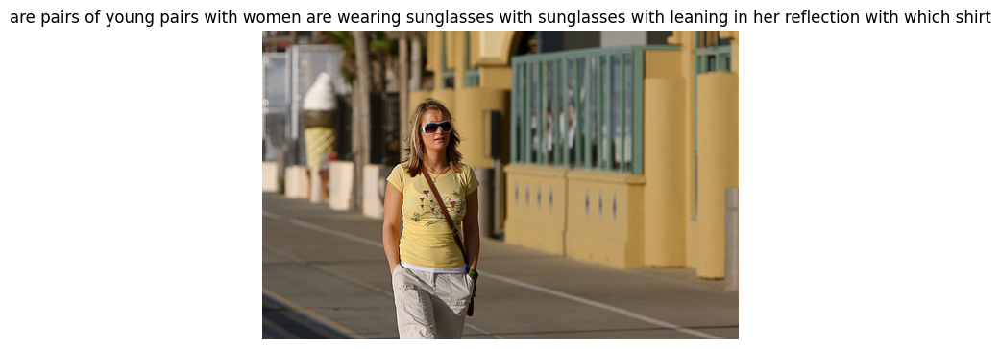

1/1 [==============================] - 1s 1s/step


In [ ]:

test_image_path = f"{images}/{test}"

# Generate a caption for the image
caption = generate_caption(test_image_path)

# Load and display the image
test_image = Image.open(test_image_path)
plt.imshow(test_image)
plt.title(caption)
plt.axis('off')
plt.show()

# Extract features from the image
img_features = extract_features_from_image(test_image_path)


### Conclusion:
In our initial exploration of image captioning, employing CNN and LSTM architectures yielded results that fell short of our expectations. Despite our best efforts, the accuracy of the models did not meet the desired benchmarks, highlighting the challenges inherent in the task at hand. As a reference point, the general accuracy achieved by conventional CNN and LSTM approaches hovered around [60%].

Moving forward, we pivot our focus towards implementing the beam search algorithm—a promising technique known for its ability to generate more coherent and contextually relevant captions. By integrating ***beam search*** into our framework, we aim to enhance the quality and fluency of generated captions, thus elevating the performance of our image captioning system.




#### This Python function, extract_feature_from_image, performs the following tasks:
1. **Xception Model Initialization**: Initializes the Xception model for feature extraction without top layers.
2. **Image Preprocessing**: Loads, resizes, and preprocesses the image for compatibility with the Xception model.
3. **Feature Extraction**: Extracts image features using the pre-trained Xception model and returns the feature vector.

In [ ]:
def extract_feature_from_image(img_path):
    # Load the Xception model
    model_xception = Xception(include_top=False, pooling='avg')

    img = Image.open(img_path)
    img = img.resize((299, 299))
    img_array = np.expand_dims(np.array(img), axis=0)
    img_array = preprocess_input(img_array)

    # Extract features
    feature = model_xception.predict(img_array)

    return feature

#### Loading a sample image to test

In [ ]:
path = '/content/drive/MyDrive/Deep learning project/8k_images/Images/1007129816_e794419615.jpg'
photo = extract_feature_from_image( path)


1/1 [==============================] - 2s 2s/step


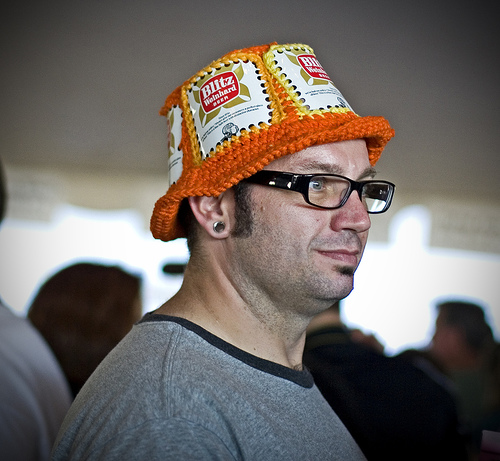

In [ ]:
from PIL import Image
# temp = "drive/MyDrive/Deep learning project/test images/Screenshot 2024-04-22 161846.png"
img = Image.open('/content/drive/MyDrive/Deep learning project/8k_images/Images/1007129816_e794419615.jpg')
img

#### loading pre-trained model

In [ ]:
pred_model  = load_model('drive/MyDrive/Deep learning project/base_data/models/model_9.h5')

#### This Python function, `flatten`, recursively flattens a nested list into a single-dimensional list. Here's a brief explanation:

- It takes a nested list `lst` as input.
- If an element of the list is not itself a list, it appends it directly to the result.
- If an element is a list, it recursively calls `flatten` on that element to flatten it further.
- It combines the flattened elements using list comprehension and the `sum` function with an empty list as the initial value.

Overall, this function effectively flattens any nested list structure into a single list.



In [ ]:
def flatten(lst):
    return sum( ([x] if not isinstance(x, list) else flatten(x) for x in lst), [] )

#### Defining Parameters

In [ ]:
vocab_size = 8764
beam_width = 10
max_length = 32
caption, prob = generate_caption_beam(pred_model, tokenizer, photo, max_length,vocab_size,beam_width)
print(caption)
print(prob)


<ipython-input-1-b84e24f765ea>:22: RuntimeWarning: divide by zero encountered in log
  temp_prob[j,] = (1/(num_words)) *(most_likely_prob[j]*(num_words-1) + np.log(model_softMax_output)) #update most likily prob


['group of people are standing in front of white building with their hands', 'group of people are standing in front of white building with their faces', 'group of people walk down the sidewalk', 'group of people are walking down the sidewalk', 'group of people stand in front of building', 'group of people are standing in front of white building', 'group of people are standing in front of building', 'group of people are walking down city street', 'group of people are walking down the street', 'group of people walk down the street']
[-1.4382434 -1.4093789 -1.1614826 -1.1395767 -1.1067472 -1.0943769
 -1.0426563 -1.0401872 -1.0388747 -0.9949494]


In [ ]:
actual = train_descriptions[path.split('/')[-1]]

### The output of Beam Search Algorithm compared to original captions with corrosponding probabilities.

In [ ]:
stats = pd.DataFrame({
    'Original_caption':actual,
    'generated_caption':caption[-5:],
    'probability':prob[-5:]
})

In [ ]:
stats

,Original_caption,generated_caption,probability
0,<start> man in an orange hat starring at somet...,group of people are standing in front of white...,-1.094377
1,<start> man wears an orange hat and glasses <end>,group of people are standing in front of building,-1.042656
2,<start> man with gauges and glasses is wearing...,group of people are walking down city street,-1.040187
3,<start> man with glasses is wearing beer can c...,group of people are walking down the street,-1.038875
4,<start> the man with pierced ears is wearing g...,group of people walk down the street,-0.994949


## validate the data using BLEU Score

In [ ]:
from PIL import Image
import os
import numpy as np

def images_to_arrays(path, directory):
    image_arrays = []

    # Create a NumPy array with shape (810,)
    arr = np.zeros((len(directory),), dtype=object)
    i = 0
    for img in directory:
      img_path = os.path.join(path, img)
      image = Image.open(img_path)
      image_array = np.array(image)
      arr[0] = image_array
    return arr

# Replace 'path_to_images_directory' with the path to your directory containing images
image_directory = "/content/drive/MyDrive/Deep learning project/8k_images/Images"
image_arrays = images_to_arrays(image_directory, test_images)

# If you want to inspect the shape of the arrays
print("Shape of image arrays:", image_arrays.shape)

Shape of image arrays: (810,)


In [ ]:


image_captions_candidate = dict()
for image_fileName in test_images:
    image_fileName_feature = image_fileName

    image_captions_candidate[image_fileName] = generate_caption(image_directory + "/" + image_fileName)

fid = open("/content/drive/MyDrive/Deep learning project/base_data" + "/test_captions_post_concat","wb")
dump(image_captions_candidate, fid)
fid.close()

1/1 [==============================] - 1s 699ms/step


In [ ]:
#greedy bleu
from nltk.translate.bleu_score import sentence_bleu
from nltk.translate.bleu_score import SmoothingFunction
from pickle import load

images_path="/content/drive/MyDrive/Deep learning project/base_data"

fid = open(images_path + "/test_captions_post_concat","rb")
image_captions_candidate = load(fid)
fid.close()

# fid = open(images_path + "/test_captions_concate_beam5_post","rb")
# image_captions_candidate_beam5 = load(fid)
# fid.close()

image_captions_test = dict()
for i in test_images:
  image_captions_test[i] = descriptions[i]

chencherry = SmoothingFunction()

bleu_score = dict()
bleu_score_beam5 = dict()
for image_fileName, reference_captions in image_captions_test.items():
    ref_cap_reformat=list()
    for cap in reference_captions:
        ref_cap_reformat.append(cap.split()[1:-1])

    bleu_score[image_fileName] = sentence_bleu(ref_cap_reformat, image_captions_candidate[image_fileName], smoothing_function=chencherry.method1)
    # bleu_score_beam5[image_fileName] = sentence_bleu(ref_cap_reformat, list(image_captions_candidate_beam5[image_fileName][-1].split()), smoothing_function=chencherry.method1)


In [ ]:
import numpy as np
bleu_score_array = np.fromiter(bleu_score.values(), dtype=float)
print('mean bleu='+str(np.mean(bleu_score_array)) + '; median bleu='+str(np.median(bleu_score_array))+'; max bleu='+str(np.max(bleu_score_array))+'; min bleu='+str(np.min(bleu_score_array))+'; std bleu='+str(np.std(bleu_score_array)))



mean bleu=0.0; median bleu=0.0; max bleu=0.0; min bleu=0.0; std bleu=0.0


## **ROUGE**

In [ ]:
 !pip install rouge-score

  Preparing metadata (setup.py) ... done
  Created wheel for rouge-score: filename=rouge_score-0.1.2-py3-none-any.whl size=24933 sha256=3cd738518e045c9c7f8192c758b8b9639786adb9506ec64d5cdb4ba3dd1aaf5b
  Stored in directory: /root/.cache/pip/wheels/5f/dd/89/461065a73be61a532ff8599a28e9beef17985c9e9c31e541b4
Successfully built rouge-score


In [ ]:
from rouge_score import rouge_scorer

# Initialize the RougeScorer with the desired metrics and stemming
scorer = rouge_scorer.RougeScorer(['rouge1', 'rouge2', 'rougeL'], use_stemmer=True)

rouge_score = dict()
for image_fileName, reference_captions in image_captions_test.items():
    # Clean candidate caption
    cand = image_captions_candidate[image_fileName].replace("startseq ", "").replace(" endseq", ".")

    # Reformat reference captions
    ref_cap_reformat = [' '.join(cap.split()[1:-1]) for cap in reference_captions]

    # Initialize a dictionary to store scores
    scores = {key: [] for key in ['rouge1', 'rouge2', 'rougeL']}

    # Calculate scores for each reference caption
    for ref in ref_cap_reformat:
        temp_scores = scorer.score(ref, cand)
        for key in temp_scores:
            scores[key].append(temp_scores[key].fmeasure)

    # Average scores for each metric
    avg_scores = {key: sum(values) / len(values) for key, values in scores.items()}
    rouge_score[image_fileName] = avg_scores

# Print or return rouge_score dictionary as needed
print(rouge_score)


{'3151492269_28d8edaa68.jpg': {'rouge1': 0.09087388499153205, 'rouge2': 0.02162162162162162, 'rougeL': 0.0715265656442127}, '639120223_7db6bdb61f.jpg': {'rouge1': 0.04324324324324324, 'rouge2': 0.01142857142857143, 'rougeL': 0.032432432432432434}, '3619806638_7480883039.jpg': {'rouge1': 0.03608695652173912, 'rouge2': 0.0, 'rougeL': 0.018695652173913044}, '3107368071_724613fc4f.jpg': {'rouge1': 0.04034146188368955, 'rouge2': 0.0, 'rougeL': 0.04034146188368955}, '1476002408_4256b7b2fa.jpg': {'rouge1': 0.021621621621621623, 'rouge2': 0.0, 'rougeL': 0.021621621621621623}, '2461631708_decc5b8c87.jpg': {'rouge1': 0.19005003126954345, 'rouge2': 0.06318707371338951, 'rougeL': 0.1700500312695435}, '2866093652_aa717eb9ce.jpg': {'rouge1': 0.031578947368421054, 'rouge2': 0.0, 'rougeL': 0.031578947368421054}, '1461667284_041c8a2475.jpg': {'rouge1': 0.0487012987012987, 'rouge2': 0.0, 'rougeL': 0.0487012987012987}, '3677693858_62f2f3163f.jpg': {'rouge1': 0.030038510911424905, 'rouge2': 0.0, 'rougeL':

In [ ]:
print(rouge_score["535830521_aa971319fc.jpg"])

{'rouge1': 0.03816338700059631, 'rouge2': 0.0, 'rougeL': 0.03816338700059631}


In [ ]:
import numpy as np

num_test = len(rouge_score)

rouge_1_f_score_array = np.zeros(num_test)
rouge_2_f_score_array = np.zeros(num_test)
rouge_l_f_score_array = np.zeros(num_test)

idx = 0
for val in rouge_score.values():
    rouge_1_f_score_array[idx] = val['rouge1']
    rouge_2_f_score_array[idx] = val['rouge2']
    rouge_l_f_score_array[idx] = val['rougeL']
    idx += 1

# Calculate the mean ROUGE scores
mean_rouge_1_f_score = np.mean(rouge_1_f_score_array)
mean_rouge_2_f_score = np.mean(rouge_2_f_score_array)
mean_rouge_l_f_score = np.mean(rouge_l_f_score_array)

# Print the mean ROUGE scores
print("Mean ROUGE-1 F-score:", mean_rouge_1_f_score)
print("Mean ROUGE-2 F-score:", mean_rouge_2_f_score)
print("Mean ROUGE-L F-score:", mean_rouge_l_f_score)



Mean ROUGE-1 F-score: 0.07780558116552314
Mean ROUGE-2 F-score: 0.011490993860496828
Mean ROUGE-L F-score: 0.07133988426334417


In [ ]:
mean_values = {
    "f-scores": ["Rouge-1", "Rouge-2", "Rouge-L"],
    "Greedy Search Mean": [rouge_1_f_score_array.mean(), rouge_2_f_score_array.mean(), rouge_l_f_score_array.mean()]
}

# Create DataFrame
df = pd.DataFrame(mean_values)

# Print table
df

,f-scores,Greedy Search Mean
0,Rouge-1,0.077806
1,Rouge-2,0.011491
2,Rouge-L,0.071340


In [ ]:
import matplotlib.pyplot as plt


Text(0, 0.5, 'ROUGE-1 F1 Score')

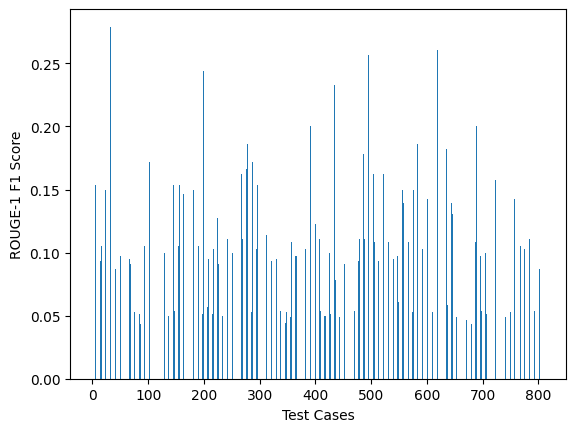

In [ ]:
index = np.arange(num_test)

# Plotting the bar graph

plt.bar(index + 0.30, rouge_1_f_score_array,0.30, label='ROUGE-1 F1 Score')

plt.xlabel('Test Cases')
plt.ylabel('ROUGE-1 F1 Score')

Text(0, 0.5, 'ROUGE-2 F1 Score')

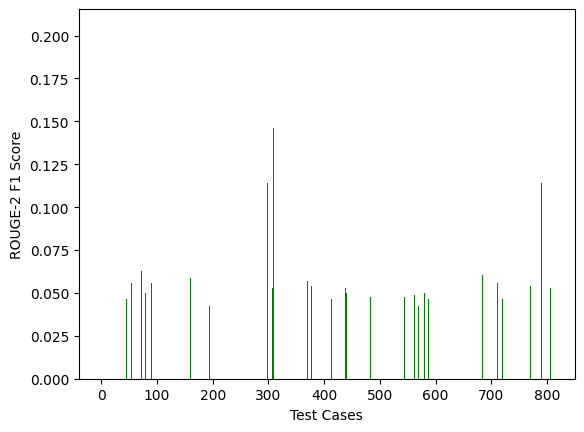

In [ ]:
plt.bar(index + 0.30, rouge_2_f_score_array, 0.30, label='ROUGE-2 F1 Score', color='g')
plt.xlabel('Test Cases')
plt.ylabel('ROUGE-2 F1 Score')

Text(0, 0.5, 'ROUGE-L F1 Score')

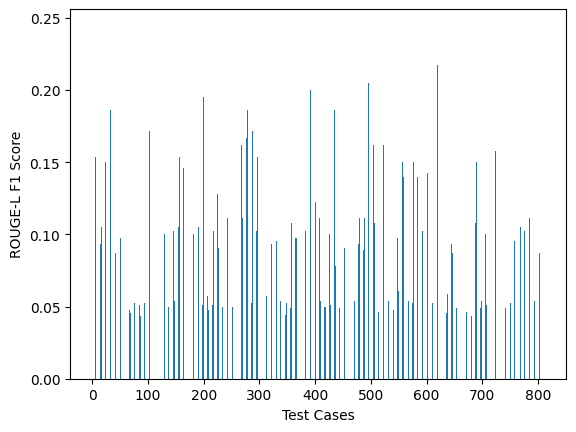

In [ ]:
plt.bar(index + 2 * 0.3, rouge_l_f_score_array, 0.3, label='ROUGE-L F1 Score')
plt.xlabel('Test Cases')
plt.ylabel('ROUGE-L F1 Score')

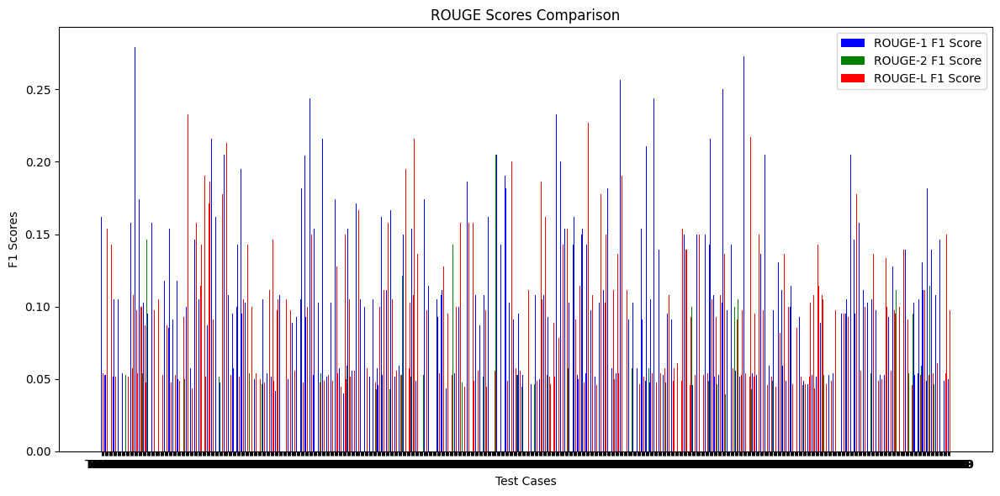

In [ ]:
bar_width = 0.25
index = np.arange(num_test)

# Plotting the bar graph
plt.figure(figsize=(12, 6))
plt.bar(index, rouge_1_f_score_array, bar_width, label='ROUGE-1 F1 Score', color='b')
plt.bar(index + bar_width, rouge_2_f_score_array, bar_width, label='ROUGE-2 F1 Score', color='g')
plt.bar(index + 2 * bar_width, rouge_l_f_score_array, bar_width, label='ROUGE-L F1 Score', color='r')

# Adding labels and title
plt.xlabel('Test Cases')
plt.ylabel('F1 Scores')
plt.title('ROUGE Scores Comparison')
plt.xticks(index + bar_width, ['Test ' + str(i+1) for i in range(num_test)])
plt.legend()

# Display the plot
plt.tight_layout()
plt.show()

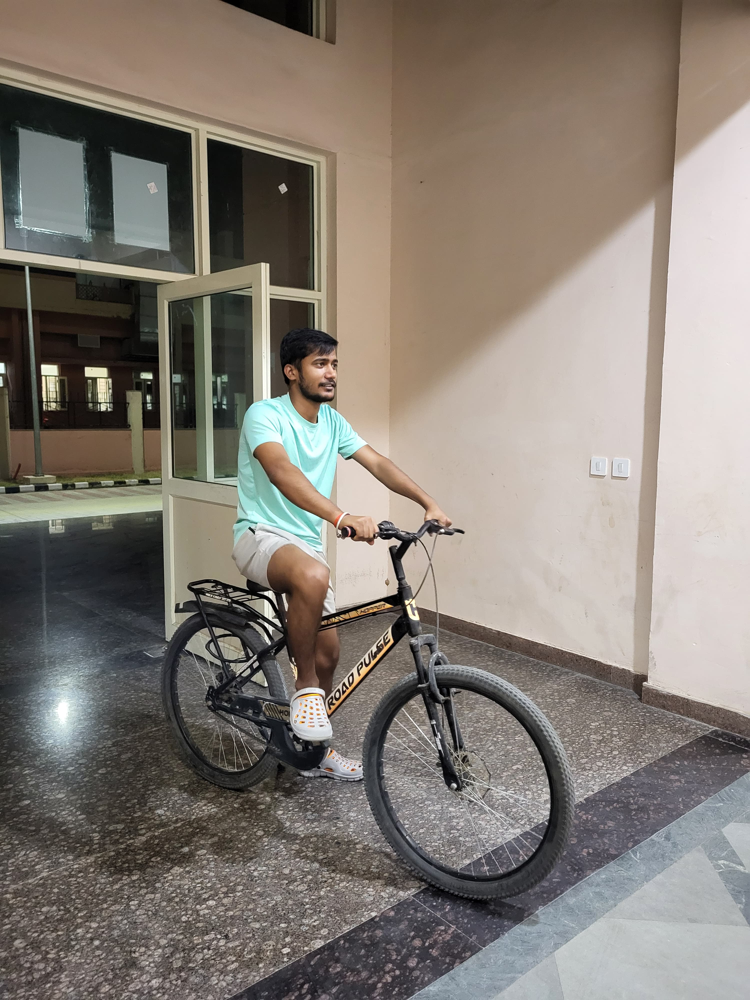

In [ ]:
from PIL import Image
temp = "/content/drive/MyDrive/Deep learning project/test images/IMG-20240519-WA0008.jpg"
img = Image.open(temp)
# img = Image.open(img)

img

In [ ]:
from keras.preprocessing.sequence import pad_sequences
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt

# Load the trained model
model = load_model('drive/MyDrive/Deep learning project/base_data/models/model_9.h5')

def extract_features_from_image(img_path):
    # Load the Xception model
    model_xception = Xception(include_top=False, pooling='avg')

    img = Image.open(img_path)
    img = img.resize((299, 299))
    img_array = np.expand_dims(np.array(img), axis=0)
    img_array = preprocess_input(img_array)

    # Extract features
    feature = model_xception.predict(img_array)

    return feature

# Function to map word index to word
def word_for_id(integer, tokenizer):
    for word, index in tokenizer.word_index.items():
        if index == integer:
            return word
    return None

def generate_caption(image_array):
    # Preprocess the image
    # image_array = preprocess_image(image_array)

    # Extract features using the pre-trained CNN model
    image_feature = extract_features_from_image(image_array)

    # Initialize an empty caption list
    caption = []

    # Define the maximum length of the caption
    max_caption_length = 32

    # Initialize the input sequence with start token
    input_sequence = tokenizer.texts_to_sequences(['<start>'])[0]

    # Loop until maximum caption length is reached
    for i in range(max_caption_length):
        # Pad the input sequence
        input_sequence = pad_sequences([input_sequence], maxlen=max_length, padding='post')

        # Predict the next word probability using the model
        yhat = model.predict([image_feature, input_sequence], verbose=0)

        # Get the index of the word with the highest probability
        yhat_index = np.argmax(yhat)

        # Map the index to the word
        word = word_for_id(yhat_index, tokenizer)

        # If the word is not found, break the loop
        if word is None:
            break

        # Append the word to the caption
        caption.append(word)

        # Break the loop if the end token is encountered
        if word == '<end>':
            break

        # Update the input sequence for the next iteration
        input_sequence = np.append(input_sequence, yhat_index)

    # Join the words in the caption list to form the final caption
    final_caption = ' '.join(caption)

    return final_caption

# Function to preprocess the image
def preprocess_image(image_array):
    image = Image.fromarray(image_array)
    image = image.resize((299, 299))
    image = np.array(image)
    image = preprocess_input(image)
    return image

# Specify the path to the test image
# test_image_path = temp;


In [ ]:


# Generate a caption for the image
caption = generate_caption(temp)



1/1 [==============================] - 1s 680ms/step


In [ ]:
caption

'horse is running through the grass with the other and dog in the background and white dog is on the grass and white dog is flying through the grass and the other'

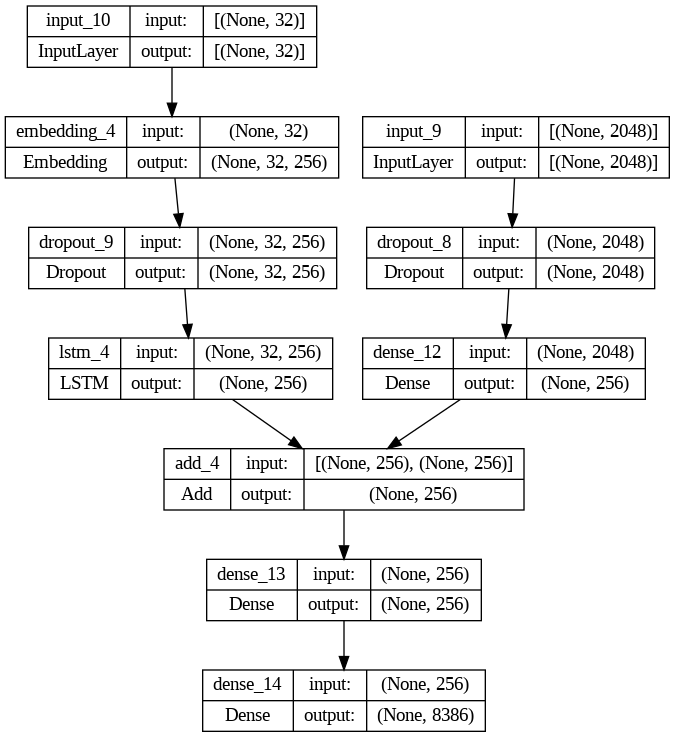

In [ ]:
plot_model(model, show_shapes=True)